# Snowflake Classification

This lab extends binary logistic regression to [multi-class logistic regression](https://en.wikipedia.org/wiki/Multinomial_logistic_regression), which goes by a variety of names, including *softmax regression*, due to the use of the softmax function, which generalizes the logistic function.

In [1]:
# Import the libraries we'll use below.
import importlib
import numpy as np
from matplotlib import pyplot as plt
import pandas as pds
import seaborn as sns  # for nicer plots
sns.set(style="darkgrid")  # default style

import tensorflow as tf
from tensorflow import keras
from keras import metrics
tf.get_logger().setLevel('INFO')

physical_devices = tf.config.list_physical_devices('GPU')

if physical_devices:
    # GPU(s) available
    print('GPU:', physical_devices)
else:
    print('No GPU available')

No GPU available


Get the images from the image folder.
They are located in img folder separated with training and test and categorized into: AG(aggregate),CC(columnarcrystal),GR(graupel),PC(planarcrystal),SP(smallparticle)

In [2]:
import glob
from PIL import Image

snowType = {'AG':'aggregate', 'CC':'columnarcrystal', 'GR':'graupel', 'PC':'planarcrystal', 'SP':'smallparticle', 'GRT': 'grapel-trans'}
particleType = {'AG':'group', 'CC':'fiber', 'GR':'raised', 'PC':'peel', 'SP':'bubble', 'GRT': 'indentation'}

TypeList = []

trainPath = 'img/training/'
testPath = 'img/test/'
x_train = {}
x_test = {}

#import the image files from the folders
for t in snowType.keys():
    TypeList.append(t)
    train_images = glob.glob(trainPath + '/' + t + '/*.png', recursive=True)
    test_images = glob.glob(testPath + '/' + t + '/*.png', recursive=True)

    size = 128, 128

    trans = t + 'T'
    if len(t) < 3:
        x_train[t] = []
        x_test[t] = []
    
    x_train[trans] = []
    x_test[trans] = []

    for i, image in enumerate(train_images):
        x_train[t].append(np.asarray(Image.open(image).resize(size)))
        if trans in snowType:
            x_train[trans].append(np.asarray(255 - x_train[t][i]))
    for i, image in enumerate(test_images):
        x_test[t].append(np.asarray(Image.open(image).resize(size)))
        if trans in snowType:
            x_test[trans].append(np.asarray(255 - x_test[t][i]))

### Display 1 image of each category

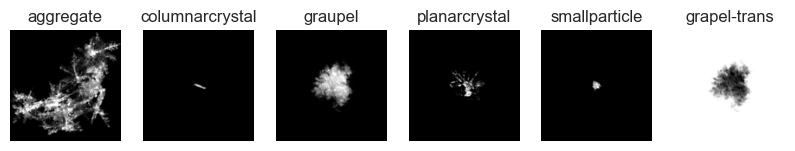

In [161]:
fig, axs = plt.subplots(nrows=1, ncols=6, figsize=(10,5))
for i, key in enumerate(snowType):
  image = x_train[key][0]
  label_name = snowType[key]
  axs[i].imshow(image, cmap='gray')
  axs[i].set_title(label_name)
  axs[i].axis('off')
plt.show()

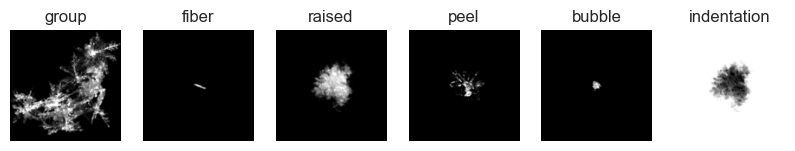

In [3]:

# Create a figure with subplots. This returns a list of object handles in axs
# which we can use to populate the plots.
fig, axs = plt.subplots(nrows=1, ncols=6, figsize=(10,5))
for i, key in enumerate(snowType):
  image = x_train[key][0]
  label_name = particleType[key]
  axs[i].imshow(image, cmap='gray')
  axs[i].set_title(label_name)
  axs[i].axis('off')
plt.show()

### Put categories into integers and display

In [4]:
np.random.seed(1234)
train_size = 500
test_size = 50
X_train = np.empty((0,128,128))
Y_train = np.empty(0)
X_test = np.empty((0,128,128))
Y_test = np.empty(0)

for i, t in enumerate(snowType):
    indices = np.arange(len(x_train[t]))
    shuffled_indices = np.random.permutation(indices)
    X_train = np.concatenate([X_train , np.copy(x_train[t])[shuffled_indices][0:train_size]])
    Y_train = np.concatenate([Y_train, np.full(train_size, int(i))])

    indices = np.arange(len(x_test[t]))
    shuffled_indices = np.random.permutation(indices)
    X_test = np.concatenate([X_test, np.copy(x_test[t])[shuffled_indices][0:test_size]])
    Y_test = np.concatenate([Y_test, np.full(test_size, int(i))])
    

(3000, 128, 128)
(300, 128, 128)


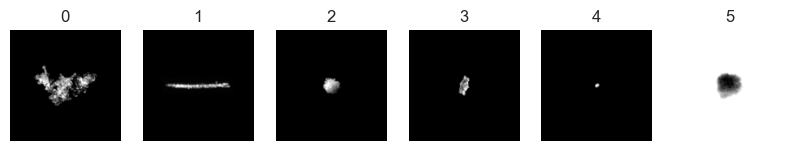

In [5]:

print(X_train.shape)
print(X_test.shape)
indices = np.arange(X_train.shape[0])
shuffled_indices = np.random.permutation(indices)
X_train = X_train[shuffled_indices]
Y_train = Y_train[shuffled_indices]

indices = np.arange(X_test.shape[0])
shuffled_indices = np.random.permutation(indices)
X_test = X_test[shuffled_indices]
Y_test = Y_test[shuffled_indices]

fig, axs = plt.subplots(nrows=1, ncols=6, figsize=(10,5))
for i in range(6):
  image = X_train[np.argmax(Y_train == i)]
  axs[i].imshow(image, cmap='gray')
  axs[i].set_title(int(i))
  axs[i].axis('off')
plt.show()

### Using Decision Tree


Accuracy: 0.785


C:\Users\User1\AppData\Local\Temp\ipykernel_25236\4158998875.py:15: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import Image, display


Output: img/snowFlake-decisiontree.jpg


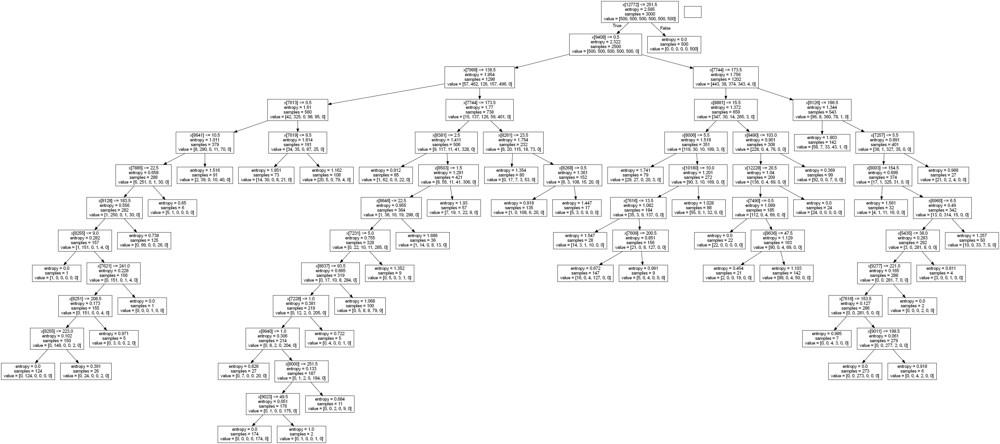

In [172]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from six import StringIO
from sklearn.decomposition import PCA
import pydot

# Train a decision tree classifier.
dt = DecisionTreeClassifier(criterion='entropy', min_samples_split=150)
X_dt = X_train.reshape((X_train.shape[0], -1))
X_dt_test = X_test.reshape((X_test.shape[0], -1))
dt.fit(X_dt, Y_train)
print ('Accuracy:', dt.score(X_dt, Y_train))


from IPython.core.display import Image, display 
output_name = 'img/snowFlake-decisiontree.jpg'
dot_data = StringIO()
tree.export_graphviz(dt, out_file=dot_data)
graph = pydot.graph_from_dot_data(dot_data.getvalue())[0]
graph.write_jpeg(output_name)

print ('Output:', output_name)
display(Image(filename=output_name))



In [173]:
max_depth = dt.tree_.max_depth
print('Mac Depth:' , max_depth)
print('Tree Nodes:' , dt.tree_.node_count)

Mac Depth: 13
Tree Nodes: 85


# Decision tree with PCA

In [174]:
#flat_Xtrain = X_train.reshape(X_train.shape[0], -1)
#flat_Xtest = X_test.reshape(X_test.shape[0], -1)

n_components = 300  # Number of principal components to keep
pca = PCA(n_components=n_components, svd_solver='randomized', whiten=True)
Xtrain_pca = pca.fit_transform(X_dt)
dt.fit(Xtrain_pca, Y_train)
Xtest_pca = pca.fit_transform(X_test.reshape((X_test.shape[0], -1)))
print ('Accuracy:', dt.score(Xtest_pca , Y_test))

Accuracy: 0.32666666666666666


C:\Users\User1\AppData\Local\Temp\ipykernel_25236\2931110384.py:3: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import Image, display


Output: img/snowFlake-pca-decisiontree.jpg


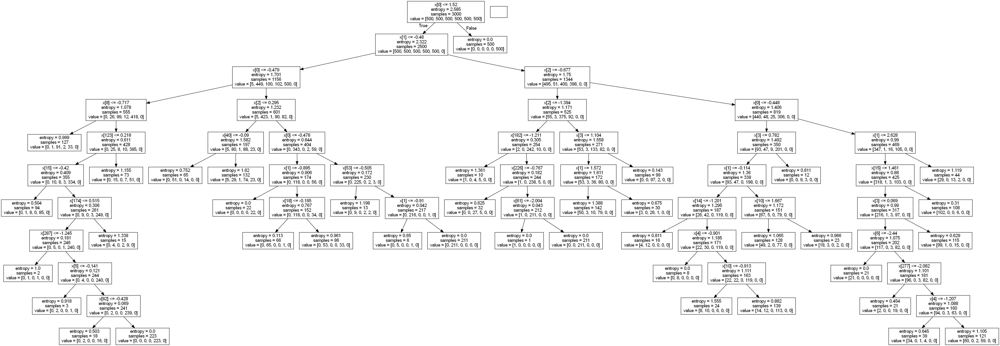

In [175]:
# Export the trained tree so we can look at it.

from IPython.core.display import Image, display 
output_name = 'img/snowFlake-pca-decisiontree.jpg'
dot_data = StringIO()
tree.export_graphviz(dt, out_file=dot_data)
graph = pydot.graph_from_dot_data(dot_data.getvalue())[0]
graph.write_jpeg(output_name)

print ('Output:', output_name)
display(Image(filename=output_name))

In [176]:
max_depth = dt.tree_.max_depth
print('Mac Depth:' , max_depth)
print('Tree Nodes:' , dt.tree_.node_count)

Mac Depth: 10
Tree Nodes: 75


# Decision tree with T-SNE

(<Figure size 800x800 with 1 Axes>,
 <Axes: >,
 [Text(-20.222172, 20.297756, '0'),
  Text(15.352977, -8.26893, '1'),
  Text(-35.168335, -1.6295418, '2'),
  Text(-15.707397, -0.60412204, '3'),
  Text(2.140284, -28.685425, '4'),
  Text(49.890255, 19.278034, '5')])

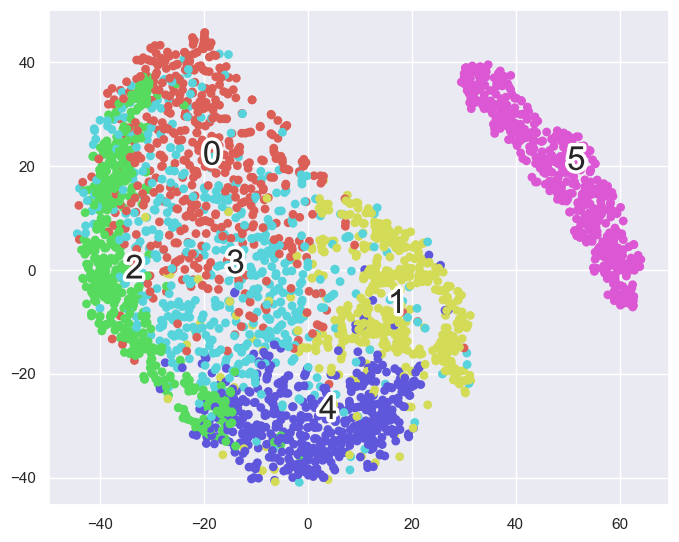

In [177]:
import seaborn as sb
import matplotlib.patheffects as pe
from sklearn.manifold._t_sne import TSNE
import time

RS=123
time_start = time.time()
X_TSNE = X_train.reshape((X_train.shape[0], -1))
#fashion_tsne_2d = TSNE(n_components=2,perplexity=40,early_exaggeration= 40,n_iter=500,verbose=1,random_state=RS).fit_transform(X_TSNE)
TSNE_trained = TSNE(perplexity=30).fit_transform(X_TSNE ) 


def plot(x, colors):
  
    palette = np.array(sb.color_palette("hls", 6))  #Choosing color palette 

    # Create a scatter plot.
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40, c=palette[colors.astype(int)])
    # Add the labels for each digit.
    txts = []
    for i in range(6):
        # Position of each label.
        xtext, ytext = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xtext, ytext, str(i), fontsize=24)
        txt.set_path_effects([pe.Stroke(linewidth=5, foreground="w"), pe.Normal()])
        txts.append(txt)
    return f, ax, txts

plot(TSNE_trained,Y_train)

In [166]:
X_TSNE_test = TSNE(perplexity=30).fit_transform(X_test.reshape((X_test.shape[0], -1))) 
dt.fit(X_TSNE_test, Y_test)

print ('Accuracy:', dt.score(X_TSNE_test , Y_test))

Accuracy: 0.49


C:\Users\User1\AppData\Local\Temp\ipykernel_25236\1533564774.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import Image, display


Output: img/snowFlake-tsne-decisiontree.jpg


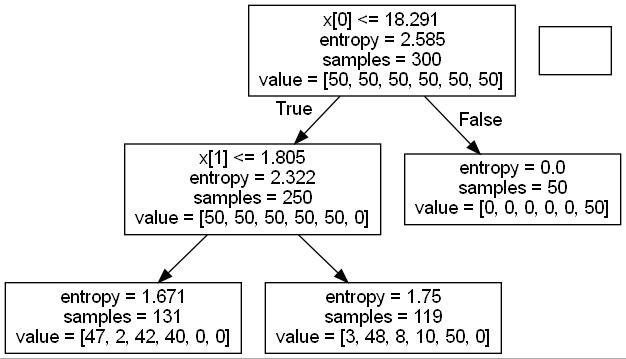

In [167]:
from IPython.core.display import Image, display 
output_name = 'img/snowFlake-tsne-decisiontree.jpg'
dot_data = StringIO()
tree.export_graphviz(dt, out_file=dot_data)
graph = pydot.graph_from_dot_data(dot_data.getvalue())[0]
graph.write_jpeg(output_name)

print ('Output:', output_name)
display(Image(filename=output_name))

In [168]:
max_depth = dt.tree_.max_depth
print('Mac Depth:' , max_depth)
print('Tree Nodes:' , dt.tree_.node_count)

Mac Depth: 2
Tree Nodes: 5


# Random Forest

In [205]:
# Random Forest
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import joblib
from sklearn.metrics import accuracy_score, classification_report
import os

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

file_name= 'models/random_forest_model.joblib'
if os.path.exists(file_name):
    rf_classifier = joblib.load(file_name)
    print(f"The file {file_name} already exists.")
  
else:
    # Train the model
    rf_classifier.fit(X_train.copy().reshape((X_train.shape[0],-1)), Y_train.copy())
    joblib.dump(rf_classifier, file_name)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test.reshape((X_test.shape[0],-1)))

# Evaluate the model
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Print classification report
print("Classification Report:")
print(classification_report(Y_test, y_pred))

The file models/random_forest_model.joblib already exists.
Accuracy: 0.88
Classification Report:
              precision    recall  f1-score   support

         0.0       0.77      0.82      0.80        50
         1.0       0.91      0.86      0.89        50
         2.0       0.96      0.94      0.95        50
         3.0       0.71      0.70      0.71        50
         4.0       0.90      0.94      0.92        50
         5.0       1.00      1.00      1.00        50

    accuracy                           0.88       300
   macro avg       0.88      0.88      0.88       300
weighted avg       0.88      0.88      0.88       300



In [182]:

trees = rf_classifier.estimators_
print(len(trees))
num_nodes = 0
max_depth = 0
# Get the number of nodes for each tree
for i, tree in enumerate(trees):
    # Use the apply method to get unique leaf indices
    leaf_indices = tree.apply(X_train.copy().reshape((X_train.shape[0],-1)))
    
    # Count the number of unique leaf indices to get the number of nodes
    num_nodes = num_nodes + len(set(leaf_indices))
    if tree.tree_.max_depth > max_depth:
        max_depth = tree.tree_.max_depth


print('Tree Nodes:' , num_nodes)
print('Max Depth:' , max_depth)

100


Tree Nodes: 42129
Max Depth: 35


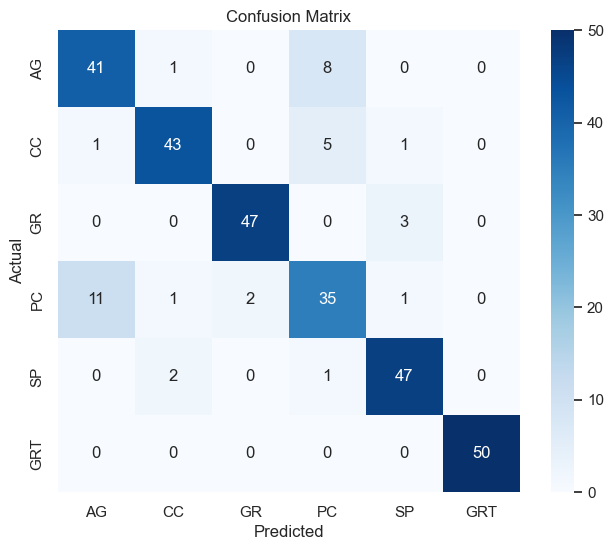

In [206]:
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(Y_test, y_pred)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", square=True, xticklabels=list(particleType), yticklabels=list(particleType))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
print(X_train.copy().reshape((X_train.shape[0],-1)).shape)

(3000, 16384)


In [ ]:
from sklearn.tree import export_graphviz
import pydotplus

# Set the output name for the image
tree_to_visualize = 0  # Change this index to visualize a different tree
output_name = f'img/random_forest_tree_{tree_to_visualize}.jpg'

if os.path.exists(output_name):
    display(Image(filename=output_name))
else:
    dt = rf_classifier.estimators_[tree_to_visualize]
    dot_data = StringIO() # Generate DOT data for the tree
    export_graphviz(dt, out_file=dot_data, filled=True, rounded=True, special_characters=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())# Create a graph from the DOT data
    graph.write_jpeg(output_name)    # Save the tree visualization as an image

    # Display the image
    print('Output:', output_name)
    display(Image(filename=output_name))

# Nearest Neighbors classifier.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=int(3))
knn.fit(X_train.reshape((X_train.shape[0], -1)), Y_train)
y_pred = knn.predict(X_test.reshape((X_test.shape[0], -1)))
accuracy = accuracy_score(Y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.85


# K-means model

In [139]:
from sklearn.cluster import KMeans
import math
import kMeans as km
import os
import joblib

importlib.reload(km)

stateSize = 60  # makes sure you get the same results each time

## get np array for RBG values
#X = np.array(df_colors.values)
X_kmeans = X_train.reshape((X_train.shape[0], -1))
img_dict = km.centroid_dict(x_train, snowType)

kmean_model = KMeans(n_clusters=6)
kmean_file = 'models/kmeans.joblib'
if os.path.exists(kmean_file):
  kmean_model = joblib.load(kmean_file)
  print(f"The file {kmean_file} already exists.")
else:
  kmean_model = km.find_model(X_kmeans, random_state=stateSize, start=15, types=snowType, img_dict=img_dict)
  joblib.dump(kmean_model, kmean_file)

The file models/kmeans.joblib already exists.


(16, 16384)


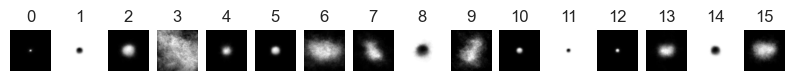

In [140]:

centroids = kmean_model.cluster_centers_
print(centroids.shape)
fig, axs = plt.subplots(nrows=1, ncols=16, figsize=(10,5))
for i, centerImg in enumerate(centroids):
  image = centerImg.reshape(128,128)
  label_name = i
  axs[i].imshow(image, cmap='gray')
  axs[i].set_title(label_name)
  axs[i].axis('off')
plt.show()

In [141]:
import math
from sklearn.metrics import accuracy_score, recall_score

print(X_kmeans.shape)

kMeanTypeList =[]
for c in centroids:
    kMeanTypeList.append(km.getType(c, snowType, img_dict))
print(kMeanTypeList)

x_predict = kmean_model.predict(X_kmeans)
predict_result = [kMeanTypeList[type] for type in x_predict]
y_predict = [TypeList[int(type)] for type in Y_train]

test_predict = kmean_model.predict(X_test.reshape((X_test.shape[0], -1)))
test_result = [kMeanTypeList[type] for type in test_predict]
test_y = [TypeList[int(type)] for type in Y_test]

train_accuracy = accuracy_score(predict_result, y_predict)
test_accuracy = accuracy_score(test_result, test_y)
print(f"Training Accuracy: {train_accuracy}")
print(f"Test Accuracy: {test_accuracy}")

(3000, 16384)
['CC', 'GRT', 'AG', 'AG', 'PC', 'GR', 'AG', 'AG', 'GRT', 'AG', 'GR', 'GRT', 'SP', 'AG', 'GRT', 'AG']
Training Accuracy: 0.6446666666666667
Test Accuracy: 0.67


# confusion_matrix

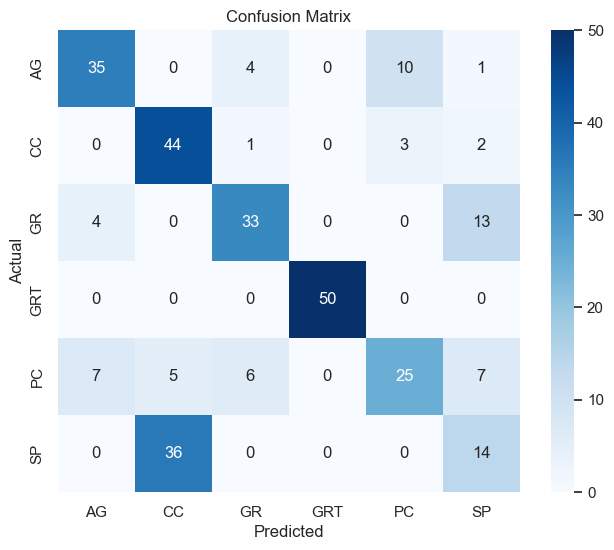

In [142]:
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(test_y, test_result)


# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", square=True, xticklabels=np.unique(test_result), yticklabels=np.unique(test_y))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Classifier Results

Name | Alteration | Accuracy
-|-|-
Decision Tree | |0.785
Decision Tree | PCA |0.32
Decision Tree | T-SNE |0.49
Random Forest|   |0.88
Nearest Neighbors|   |0.85
K-means|   |0.67

# Baseline Neural Network Training

In [51]:
import neuralNetwork as md
importlib.reload(md)
md.AccuracyList = []
print('Test Accuracy: %1.4f' % md.train_and_evaluate(X_train.copy(), X_test.copy(), Y_train.copy(), Y_test.copy(), 
                                                     activation='tanh', optimizer='SGD', file_name='models/nn-tanh-sgd'))
print('Test Accuracy: %1.4f' % md.train_and_evaluate(X_train.copy(), X_test.copy(), Y_train.copy(), Y_test.copy(), 
                                                     activation='relu', optimizer='Adam', file_name='models/nn-relu-adam'))
print('Test Accuracy: %1.4f' % md.train_and_evaluate(X_train.copy(), X_test.copy(), Y_train.copy(), Y_test.copy(), 
                                                     hidden_layer_sizes=[128],activation='relu',optimizer='Adam', file_name='models/nn-128'))
print('Test Accuracy: %1.4f' % md.train_and_evaluate(X_train.copy(), X_test.copy(), Y_train.copy(), Y_test.copy(), 
                                                     hidden_layer_sizes=[128, 128],activation='relu',optimizer='Adam', file_name='models/nn-128-128'))
print('Test Accuracy: %1.4f' % md.train_and_evaluate(X_train.copy(), X_test.copy(), Y_train.copy(), Y_test.copy(), 
                                                     hidden_layer_sizes=[64, 128, 256],activation='relu',optimizer='Adam', file_name='models/nn-64-128-256'))

The file models/nn-tanh-sgd already exists.
Test Accuracy: 0.5800
The file models/nn-relu-adam already exists.
Test Accuracy: 0.6767
The file models/nn-128 already exists.
Test Accuracy: 0.7067
The file models/nn-128-128 already exists.
Test Accuracy: 0.6933
The file models/nn-64-128-256 already exists.
Test Accuracy: 0.6233


In [ ]:
for acurracy in md.AccuracyList:
    print(acurracy.title)
    print(acurracy.model.summary())
    #acurracy.plot()

layer=[] activation=tanh optimizer=SGD
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 16384)             0         
                                                                 
 Output (Dense)              (None, 7)                 114695    
                                                                 
Total params: 114695 (448.03 KB)
Trainable params: 114695 (448.03 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
layer=[] activation=relu optimizer=Adam
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 16384)             0         
                                                                 
 Output (Dense)              (None, 7)      

# Neural Network Results

DATA | HIDDEN SIZES | ACTIVATION | OPTIMIZER | LEARNING RATE | #PARAMETERS | TEST ACCURACY
-|-|-|-|-|-|-
Snow Flakes|[]|tanh|SGD|0.01|114695|0.5800
Snow Flakes|[]|relu|Adam|0.01|114695|0.6767
Snow Flakes|[128]|relu|Adam|0.01|2097280|0.7067
Snow Flakes|[128,128]|relu|Adam|0.01|2097280|0.6933
Snow Flakes|[64, 128, 256]|relu|Adam|0.01|1048640 |0.6233

# Data Augmentation

In [67]:
import inspect

def data_augment(images, y, flip=False, contrast = 1, delta=1, crop=False):
    """ apply transformaions and augmentations
    
    Params:
    -------
    images  (np.ndarray)
    y (np.ndarray): Labels
    flip: only flip when it is True
    contrast: contrast factor
    delta: delta of the image
    
    Returns:
    --------
    images (np.ndarray)
    y (np.ndarray)
    """
    ### create train/validation/test sets ###
    #########################################
    # NOTE: Each time you run this cell, you'll re-shuffle the data. The ordering will be the same due to the random seed generator 
    tf.random.set_seed(1234)
    np.random.seed(1234)
    
    ### image augmentation on training data ###
    ###########################################
    # adjust brightness
    X_augm = tf.image.adjust_brightness(images, delta=delta)

    # adjust contrast
    X_augm = tf.image.adjust_contrast(X_augm, contrast_factor=contrast )

    # random flip
    if flip:
        X_augm = tf.image.random_flip_left_right(X_augm)

    if crop:
        X_augm = tf.image.random_crop(X_augm, size=[X_augm.shape[0], int(images.shape[1]*0.8), int(images.shape[2]*0.8)])
        X_augm = tf.expand_dims(X_augm, axis=-1)
        X_augm = tf.image.resize(X_augm , size=[images.shape[1], images.shape[2]], method='bilinear')
        X_augm = tf.squeeze(X_augm, axis=-1)

    
    # concatenate original X_train and augmented X_train data
    images = tf.concat([images, X_augm],axis=0)
    
    # concatenate y_train (note the label is preserved)
    y_augm = y
    y = tf.concat([y, y_augm],axis=0)
    
    # shuffle X_train and y_train, i.e., shuffle two tensors in the same order
    shuffle = tf.random.shuffle(tf.range(tf.shape(images)[0], dtype=tf.int32))
    images = tf.gather(images, shuffle)
    y = tf.gather(y, shuffle).numpy() #also transforms y_train to numpy array
    
    return images[0:3000], y[0:3000]

In [68]:
importlib.reload(md)
augmentList=[{"crop":True}, {"contrast":1.2}, {"contrast":1.5}, {"contrast":2},{"delta":0.1} ,{"delta":0.2},{"delta":0.3},{"flip":True}]
md.AccuracyList = []
augX_train = X_train.copy()
augY_train = Y_train.copy()

print('Test Accuracy: %1.4f' % md.train_and_evaluate(augX_train, X_test.copy(), augY_train, Y_test.copy(), 
            hidden_layer_sizes=[128],activation='relu',optimizer='Adam', file_name='models/aug'))
for i, m in enumerate(augmentList):
    augX_train, augY_train = data_augment(X_train.copy(),Y_train.copy(),**augmentList[i])
    fileName = 'models/aug'
    for key in augmentList[i].keys():
        fileName += '-' + key + str(i)
    print(fileName, ' Test Accuracy: %1.4f' % md.train_and_evaluate(augX_train, X_test.copy(), augY_train, Y_test.copy(), 
            hidden_layer_sizes=[128, 128],activation='relu',optimizer='Adam', file_name=fileName))

The file models/aug already exists.
Test Accuracy: 0.6667
The file models/aug-crop0 already exists.
models/aug-crop0  Test Accuracy: 0.6867
The file models/aug-contrast1 already exists.
models/aug-contrast1  Test Accuracy: 0.6233
The file models/aug-contrast2 already exists.
models/aug-contrast2  Test Accuracy: 0.5567
The file models/aug-contrast3 already exists.
models/aug-contrast3  Test Accuracy: 0.6533
The file models/aug-delta4 already exists.
models/aug-delta4  Test Accuracy: 0.5600
The file models/aug-delta5 already exists.
models/aug-delta5  Test Accuracy: 0.5933
The file models/aug-delta6 already exists.
models/aug-delta6  Test Accuracy: 0.6667
The file models/aug-flip7 already exists.
models/aug-flip7  Test Accuracy: 0.6800


### Using the best augmented parameters to train data

In [69]:
augmentList=[{"delta":0.12, "contrast":2, "crop":True, "flip":True}]
augX_train = X_train.copy()
augY_train = Y_train.copy()

fileName = 'models/aug'
for i, m in enumerate(augmentList):
    augX_train, augY_train = data_augment(augX_train, augY_train ,**augmentList[i])
    for key in augmentList[i].keys():
            fileName += '-' + key + str(i)

print(augX_train.shape)
print(fileName, ' Test Accuracy: %1.4f' % md.train_and_evaluate(augX_train, X_test.copy(), augY_train, Y_test.copy(), 
            hidden_layer_sizes=[128, 128],activation='relu',optimizer='Adam', file_name=fileName))

(3000, 128, 128)
The file models/aug-delta0-contrast0-crop0-flip0 already exists.
models/aug-delta0-contrast0-crop0-flip0  Test Accuracy: 0.6967


In [70]:
importlib.reload(md)
print('models/nn_aug_35e', ' Test Accuracy: %1.4f' % md.train_and_evaluate(augX_train, X_test.copy(), augY_train, Y_test.copy(), 
            hidden_layer_sizes=[128, 128],activation='relu',optimizer='Adam', file_name='models/nn_aug_35e', num_epochs=35))

The file models/nn_aug_35e already exists.
models/nn_aug_35e  Test Accuracy: 0.6833


### Augmentation using ImageDataGenerator

In [54]:
from keras.preprocessing.image import ImageDataGenerator
import neuralNetwork as md
importlib.reload(md)
md.AccuracyList = []

train_datagen = ImageDataGenerator(rotation_range=2,  # rotation
                                   width_shift_range=0.3,  # horizontal shift
                                   height_shift_range=0.3,
                                   zoom_range=0.3,  # zoom
                                   horizontal_flip=False,  # horizontal flip
                                   brightness_range=[0.5,1.5])  # brightness

aug_iter = train_datagen.flow(tf.expand_dims(X_train.copy(), axis=-1) , batch_size=1)
imgs = np.concatenate([aug_iter.next() for i in range(len(aug_iter))])
print(imgs[:, :, :,0].shape, X_train.copy().shape)
aug_x = np.concatenate([X_train.copy(), imgs[:, :, :,0]])
aug_y = np.concatenate([Y_train.copy(),Y_train.copy()])
shuffle = tf.random.shuffle(tf.range(tf.shape(aug_x)[0], dtype=tf.int32))
aug_x = tf.gather(aug_x, shuffle)
aug_y = tf.gather(aug_y, shuffle).numpy() #also transforms y_train to numpy array
print('Test Accuracy: %1.4f' % md.train_and_evaluate(aug_x[0:3000], X_test.copy(), aug_y[0:3000], Y_test.copy(), 
                                                     hidden_layer_sizes=[32,128],activation='relu',optimizer='Adam', 
                                                     file_name='models/nn-128-aug'))

(3000, 128, 128) (3000, 128, 128)
The file models/nn-128-aug already exists.
Test Accuracy: 0.3167


augmentList=[{"delta":0.12, "contrast":2, "crop":True, "flip":True}] 0.6967 epochs 3
epochs 35 0.6833

# Augmentation results
 crop | contrast | delta | flip | epochs | TEST ACCURACY
-|-|-|-|-|-
False| | |False |3 | 0.6667
True| | |False |3 | 0.6867
False|1.2| |False |3 | 0.6233
False|1.5| |False |3| 0.5567
False|2| | |3 | 0.6533
False| |0.1|False |3 | 0.5600
False| |0.2| False|3 | 0.5933
False| |0.3|False |3 | 0.6667
False| ||True|3| 0.6800
True|0.12 |2|True|3| 0.6967
True|0.12 |2|True|35| 0.6833

# CNN

In [57]:
import cnn as cnn
importlib.reload(cnn)
#  First to evaluate which parameter is better with small amount of data

cnnParameters=[{"kernel_size":(3,3)}, {"strides":(2, 2)}, {"pool_size":(3, 3)}, {"learning_rate":0.01},{"opt":'SGD'}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/cnn'
    for key in cnnParameters[i].keys():
        fileName +=str(i) + '-' + key
    print(fileName, ' Test Accuracy: %1.4f' % cnn.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
            file_name=fileName, params=cnnParameters[i], num_epochs = 1, batch_size=64))


The file models/cnn0-kernel_size already exists.
models/cnn0-kernel_size  Test Accuracy: 0.8300
The file models/cnn1-strides already exists.
models/cnn1-strides  Test Accuracy: 0.7850
The file models/cnn2-pool_size already exists.
models/cnn2-pool_size  Test Accuracy: 0.8300
The file models/cnn3-learning_rate already exists.
models/cnn3-learning_rate  Test Accuracy: 0.6150
The file models/cnn4-opt already exists.
models/cnn4-opt  Test Accuracy: 0.8050


### train with less data and with the change of the first 3 parameters

In [ ]:
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2)}, {"kernel_size":(3,3),"strides":(2, 2), "pool_size":(3, 3)}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/cnn'
    for key in cnnParameters[i].keys():
        fileName +=str(i) +'-' + key
    print(fileName, ' Test Accuracy: %1.4f' % cnn.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200], 
            file_name=fileName, params=cnnParameters[i], num_epochs = 1, batch_size=64))


The file models/cnn0-kernel_size0-strides already exists.
models/cnn0-kernel_size0-strides  Test Accuracy: 0.8250
The file models/cnn1-kernel_size1-strides1-pool_size already exists.
models/cnn1-kernel_size1-strides1-pool_size  Test Accuracy: 0.7500


### Final train with less data and with {"kernel_size":(3,3)}, {"strides":(2, 2)} with 10 epochs

In [ ]:
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2)}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/cnn-final'
    print(fileName, ' Test Accuracy: %1.4f' % cnn.train_and_evaluate(X_train.copy()[0:3000], X_test.copy()[0:300], Y_train.copy()[0:3000], Y_test.copy()[0:300], 
            file_name=fileName, params=cnnParameters[i], num_epochs = 10, batch_size=128))

The file models/cnn-final already exists.
models/cnn-final  Test Accuracy: 0.8667


CNN with image augmentation

In [58]:
importlib.reload(cnn)
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2)}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/cnn-final-aug2'
    print(fileName, ' Test Accuracy: %1.4f' % cnn.train_and_evaluate(augX_train, X_test.copy()[0:300], augY_train, Y_test.copy()[0:300], 
            file_name=fileName, params=cnnParameters[i], num_epochs = 20, batch_size=128 ))

The file models/cnn-final-aug2 already exists.
models/cnn-final-aug2  Test Accuracy: 0.8567


### CNN with img augmentation 18 epoches

In [59]:
importlib.reload(cnn)
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2)}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/cnn-final-aug18'
    print(fileName, ' Test Accuracy: %1.4f' % cnn.train_and_evaluate(augX_train, X_test.copy()[0:300], augY_train, Y_test.copy()[0:300], 
            file_name=fileName, params=cnnParameters[i], num_epochs = 18, batch_size=128 ))

The file models/cnn-final-aug18 already exists.
models/cnn-final-aug18  Test Accuracy: 0.8633


# CNN results


 kernel_size | strides | pool_size | learning_rate | opt | augmentation | epochs | batch_size | Accuracy
-|-|-|-|-|-|-|-|-
(3,3)|(1,1)|(2,2)|0.001|Adam|False|1|64|0.8300
(5,5)|(2,2)|(2,2)|0.001|Adam|False|1|64|0.7850
(5,5)|(1,1)|(3,3)|0.001|Adam|False|1|64|0.8300
(5,5)|(1,1)|(2,2)|0.01|Adam|False|1|64|0.6150
(5,5)|(1,1)|(2,2)|0.001|SGD|False|1|64|0.8050
(3,3)|(2,2)|(2,2)|0.001|Adam|False|1|64|0.8250
(3,3)|(2,2)|(3,3)|0.001|Adam|False|1|64|0.7500
(3,3)|(2,2)|(2,2)|0.001|Adam|False|10|128|0.8667
(3,3)|(2,2)|(2,2)|0.001|Adam|True|20|128|0.8567
(3,3)|(2,2)|(2,2)|0.001|Adam|False|18|128|0.8633

# ANN / CNN + ANN

In [103]:
import ANN as ann
importlib.reload(ann)

annParameters=[{},{"cnn":True, "hidden_cnn":[128, 128]}]

for i, m in enumerate(annParameters):
    fileName = 'models/ann-'
    for key in annParameters[i].keys():
        fileName +=str(i) + '-' + key
    print(fileName, ' Test Accuracy: %1.4f' % ann.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=annParameters[i], num_epochs = 6, batch_size=128 ))

The file models/ann- already exists.
models/ann-  Test Accuracy: 0.7700
The file models/ann-1-cnn1-hidden_cnn already exists.
models/ann-1-cnn1-hidden_cnn  Test Accuracy: 0.8400


In [221]:
import ANN as ann
importlib.reload(ann)
annParameters=[{"kernel_size":(3,3),"strides":(2, 2),"cnn":True, "hidden_cnn":[128, 128]}]
fileName = "models/ANN-CNN128-ep8"
print(fileName, ' Test Accuracy: %1.4f' % ann.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=annParameters[0], num_epochs = 8, batch_size=128 ))

annParameters=[{"kernel_size":(3,3),"strides":(2, 2),"cnn":True, "hidden_cnn":[32, 64, 128]}]
fileName = "models/ANN-CNN128-ep20"
print(fileName, ' Test Accuracy: %1.4f' % ann.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=annParameters[0], num_epochs = 20, batch_size=128 ))

annParameters=[{"kernel_size":(3,3),"strides":(2, 2),"cnn":True, "hidden_cnn":[64, 64, 128]}]
fileName = "models/ANN-CNN128-ep11"
print(fileName, ' Test Accuracy: %1.4f' % ann.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=annParameters[0], num_epochs = 11, batch_size=128 ))

annParameters=[{"kernel_size":(3,3),"strides":(2, 2),"cnn":True, "hidden_cnn":[64, 64, 128]}]
fileName = "models/ANN-CNN128-ep10-2"
print(fileName, ' Test Accuracy: %1.4f' % ann.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=annParameters[0], num_epochs = 10, batch_size=128 ))

annParameters=[{"kernel_size":(3,3),"strides":(2, 2),"cnn":True, "hidden_cnn":[64, 128, 256]}]
fileName = "models/ANN-CNN128-ep10-3"
print(fileName, ' Test Accuracy: %1.4f' % ann.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=annParameters[0], num_epochs = 10, batch_size=128 ))

annParameters=[{"kernel_size":(3,3),"strides":(2, 2),"cnn":True, "hidden_cnn":[64, 128, 256]}]
fileName = "models/ANN-CNN128-ep5"
print(fileName, ' Test Accuracy: %1.4f' % ann.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=annParameters[0], num_epochs = 5, batch_size=128 ))

The file models/ANN-CNN128-ep8 already exists.
models/ANN-CNN128-ep8  Test Accuracy: 0.8600
The file models/ANN-CNN128-ep20 already exists.
models/ANN-CNN128-ep20  Test Accuracy: 0.8550
The file models/ANN-CNN128-ep11 already exists.
models/ANN-CNN128-ep11  Test Accuracy: 0.8650
The file models/ANN-CNN128-ep10-2 already exists.
models/ANN-CNN128-ep10-2  Test Accuracy: 0.8750
The file models/ANN-CNN128-ep10-3 already exists.
models/ANN-CNN128-ep10-3  Test Accuracy: 0.8650
The file models/ANN-CNN128-ep5 already exists.
models/ANN-CNN128-ep5  Test Accuracy: 0.9000


models/ANN-CNN128-ep8


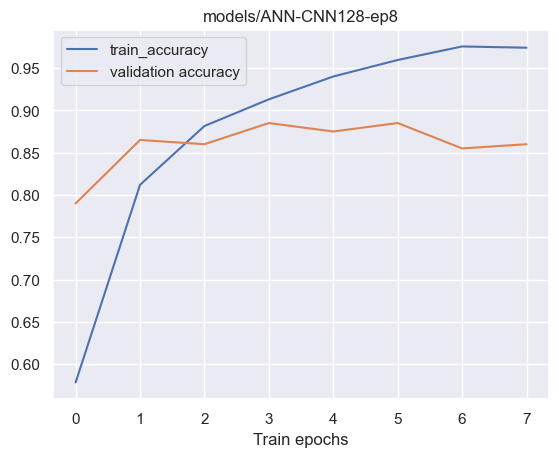

models/ANN-CNN128-ep20


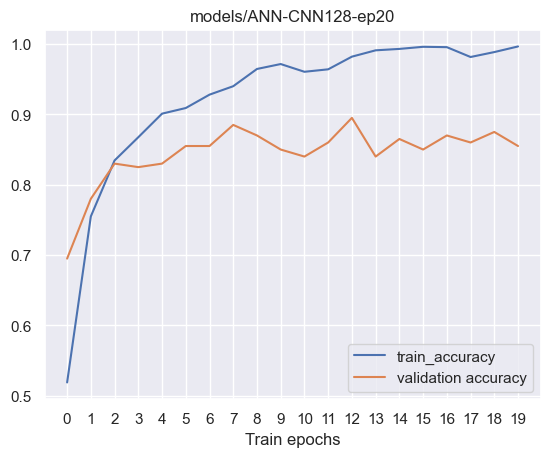

models/ANN-CNN128-ep11


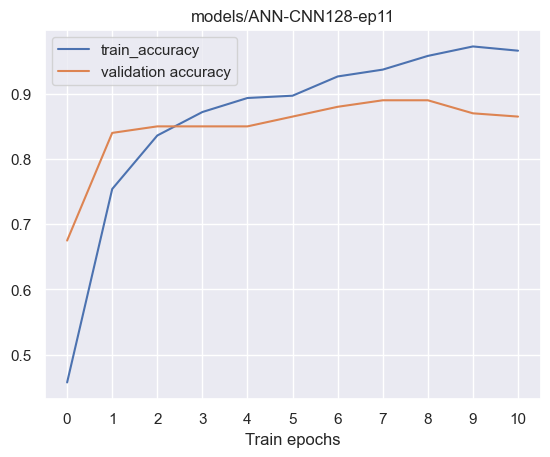

models/ANN-CNN128-ep10-2


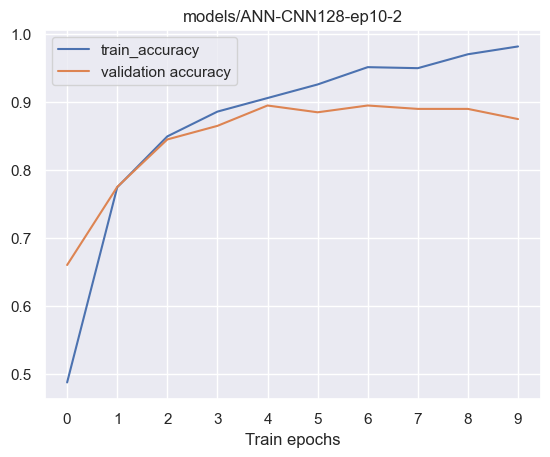

models/ANN-CNN128-ep10-3


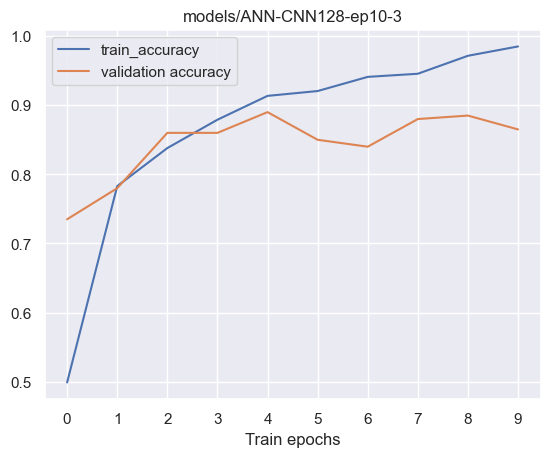

models/ANN-CNN128-ep5


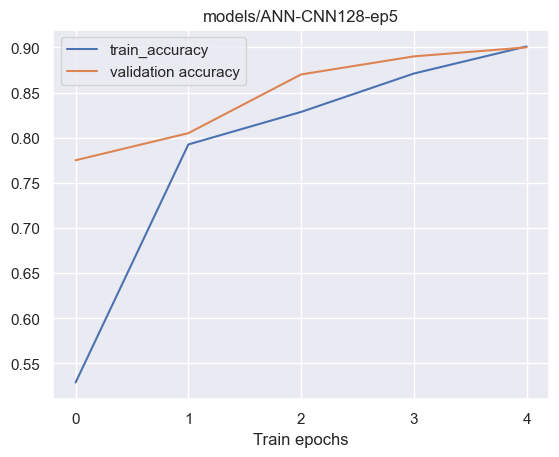

In [222]:
for acurracy in ann.AccuracyList:
    print(acurracy.title)
    acurracy.plot()

# FFN / CNN + FFN

In [ ]:
import FFN as ffn
importlib.reload(ffn)
ffnParameters=[{"hidden_layer_sizes":[128, 128]}, {"hidden_layer_sizes":[32, 64, 128]},{"hidden_layer_sizes":[128, 128],"cnn":True, "hidden_cnn":[128, 128]}]

for i, m in enumerate(ffnParameters):
    fileName = 'models/ffn-'
    for key in ffnParameters[i].keys():
        fileName +=str(i) + '-' + key
    print(fileName, ' Test Accuracy: %1.4f' % ffn.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=ffnParameters[i], num_epochs = 6, batch_size=128 ))

The file models/ffn-0-hidden_layer_sizes already exists.
models/ffn-0-hidden_layer_sizes  Test Accuracy: 0.6200
The file models/ffn-1-hidden_layer_sizes already exists.
models/ffn-1-hidden_layer_sizes  Test Accuracy: 0.4650
The file models/ffn-2-hidden_layer_sizes2-cnn2-hidden_cnn already exists.
models/ffn-2-hidden_layer_sizes2-cnn2-hidden_cnn  Test Accuracy: 0.8550


In [92]:
import FFN as ffn
importlib.reload(ffn)
ffnParameters=[{"kernel_size":(3,3),"strides":(2, 2),"hidden_layer_sizes":[128, 128],"cnn":True, "hidden_cnn":[128, 128]}]
fileName = "models/FFN-CNN128-ep6"
print(fileName, ' Test Accuracy: %1.4f' % ffn.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=ffnParameters[0], num_epochs = 6, batch_size=128 ))

ffnParameters=[{"kernel_size":(3,3),"strides":(2, 2),"hidden_layer_sizes":[128, 128],"cnn":True, "hidden_cnn":[64, 128, 256]}]
fileName = "models/FFN-CNN128-ep8"
print(fileName, ' Test Accuracy: %1.4f' % ffn.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=ffnParameters[0], num_epochs = 8, batch_size=128 ))

ffnParameters=[{"kernel_size":(3,3),"strides":(2, 2),"hidden_layer_sizes":[64, 128, 256],"cnn":True, "hidden_cnn":[64, 128, 256]}]
fileName = "models/FFN-CNN128-ep5"
print(fileName, ' Test Accuracy: %1.4f' % ffn.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=ffnParameters[0], num_epochs = 5, batch_size=128 ))

The file models/FFN-CNN128-ep6 already exists.
models/FFN-CNN128-ep6  Test Accuracy: 0.8900
The file models/FFN-CNN128-ep8 already exists.
models/FFN-CNN128-ep8  Test Accuracy: 0.8550
The file models/FFN-CNN128-ep5 already exists.
models/FFN-CNN128-ep5  Test Accuracy: 0.9000


# LSTM / CNN + LSTM

In [ ]:
import LSTM as lstm
importlib.reload(lstm)
#  First to evaluate which parameter is better with small amount of data

cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2)}, {"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[128, 128]}, {"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[32, 64, 128]}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/lstm'
    for key in cnnParameters[i].keys():
        fileName +=str(i) + '-' + key
    print(fileName, ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=cnnParameters[i], num_epochs = 7, batch_size=64 ))
    

The file models/lstm0-kernel_size0-strides already exists.
models/lstm0-kernel_size0-strides  Test Accuracy: 0.6050
The file models/lstm1-kernel_size1-strides1-cnn1-hidden_layer_sizes already exists.
models/lstm1-kernel_size1-strides1-cnn1-hidden_layer_sizes  Test Accuracy: 0.8500
The file models/lstm2-kernel_size2-strides2-cnn2-hidden_layer_sizes already exists.
models/lstm2-kernel_size2-strides2-cnn2-hidden_layer_sizes  Test Accuracy: 0.8250


### do the best parameters with 128 batc_size and 3000 training data

In [ ]:
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[128, 128]}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/lstm'
    for key in cnnParameters[i].keys():
        fileName +=str(i) + '-' + key
    print(fileName, ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:3000], X_test.copy()[0:300], Y_train.copy()[0:3000], Y_test.copy()[0:300],
                                                                      file_name=fileName, params=cnnParameters[i], num_epochs = 7, batch_size=128 ))
    

The file models/lstm0-kernel_size0-strides0-cnn0-hidden_layer_sizes already exists.
models/lstm0-kernel_size0-strides0-cnn0-hidden_layer_sizes  Test Accuracy: 0.8733


In [86]:
import LSTM as lstm
importlib.reload(lstm)

fileName = "models/CNN-LSTM-ep6-2"
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[64, 128, 256]}]
print(fileName, ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=cnnParameters[0], num_epochs = 6, batch_size=128 ))

cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[128, 128]}]
fileName = "models/CNN-LSTM-ep6"
print(fileName, ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=cnnParameters[0], num_epochs = 6, batch_size=128 ))

fileName = "models/CNN-LSTM-ep10"
print(fileName, ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=cnnParameters[0], num_epochs = 10, batch_size=128 ))

fileName = "models/CNN-LSTM-ep8"
print(fileName, ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=cnnParameters[0], num_epochs = 8, batch_size=128 ))

fileName = "models/CNN-LSTM-ep10-2"
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[64, 128, 256]}]
print(fileName, ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=cnnParameters[0], num_epochs = 10, batch_size=128 ))

fileName = "models/CNN-LSTM-ep15"
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[64, 128, 256]}]
print(fileName, ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=cnnParameters[0], num_epochs = 15, batch_size=128 ))

fileName = "models/CNN-LSTM-ep14"
print(fileName, ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=cnnParameters[0], num_epochs = 14, batch_size=128 ))



The file models/CNN-LSTM-ep6-2 already exists.
models/CNN-LSTM-ep6-2  Test Accuracy: 0.8700
The file models/CNN-LSTM-ep6 already exists.
models/CNN-LSTM-ep6  Test Accuracy: 0.8650
The file models/CNN-LSTM-ep10 already exists.
models/CNN-LSTM-ep10  Test Accuracy: 0.8750
The file models/CNN-LSTM-ep8 already exists.
models/CNN-LSTM-ep8  Test Accuracy: 0.8600
The file models/CNN-LSTM-ep10-2 already exists.
models/CNN-LSTM-ep10-2  Test Accuracy: 0.8850
The file models/CNN-LSTM-ep15 already exists.
models/CNN-LSTM-ep15  Test Accuracy: 0.8900
The file models/CNN-LSTM-ep14 already exists.
models/CNN-LSTM-ep14  Test Accuracy: 0.8800


# Other Neural Network results


NN Name | hidden_layer | CNN_Hidden_Layers | Kernal_size | strides |  epochs | batch_size | Accuracy
-|-|-|-|-|-|-|-
ANN| | |(5,5) |(1,1)|  6 | 128 | 0.7700
ANN| | [128, 128]|(5,5) |(1,1)| 6 | 128 | 0.8400
ANN| | [128, 128]|(5,5) |(1,1)| 8 | 128 | 0.8600
ANN| | [32, 64, 128] |(3,3) |(2,2)| 20 | 128 | 0.8550
ANN| | [64, 64, 128] |(3,3) |(2,2)| 8 | 128 | 0.8650
ANN| | [64, 64, 128] |(3,3) |(2,2)| 8 | 128 |  0.8750
ANN| | [64, 128, 256] |(3,3) |(2,2)| 8 | 128 | 0.8650
ANN| | [64, 128, 256] |(3,3) |(2,2)| 8 | 128 | 0.9000
FFN| [128, 128]|  |(5,5) |(1,1)| 6 | 128 | 0.6200
FFN| [32, 64, 128]|  |(5,5) |(1,1)| 6 | 128 | 0.4650
FFN| [128, 128]|[128, 128]|(5,5) |(1,1)| 6 | 128 | 0.8550
FFN| [128, 128]|[128, 128] |(3,3) |(2,2)| 6 | 128 | 0.8900
FFN| [128, 128]|[64, 128, 256] |(3,3) |(2,2)| 8 | 128 | 0.8550
FFN| [64, 128, 256]|[64, 128, 256] |(3,3) |(2,2)| 5 | 128 | 0.90
LSTM| | |(3,3) |(2,2)| 7 | 64 | 0.6050
LSTM| |[128, 128]|(3,3) |(2,2)| 7 | 64 | 0.8500
LSTM| |[128, 128]|(3,3) |(2,2)| 7 | 128 | 0.8733
LSTM| |[32, 64, 128]|(3,3) |(2,2)| 7 | 64 | 0.8250
LSTM| |[128, 128]|(3,3) |(2,2)| 6 | 128 | 0.8650
LSTM| |[128, 128]|(3,3) |(2,2)| 10 | 128 | 0.8750
LSTM| |[64, 128, 256]|(3,3) |(2,2)| 10 | 128 | 0.885
LSTM| |[64, 128, 256]|(3,3) |(2,2)| 15 | 128 | 0.89
LSTM| |[64, 128, 256]|(3,3) |(2,2)| 14 | 128 | 0.88
LSTM| |[64, 128, 256]|(3,3) |(2,2)| 6 | 128 | 0.87

# Prebuilt TensorFlow models (Transfer Learning)

### Inception

In [ ]:
import kerasNNs as k_nn
import importlib
importlib.reload(k_nn)

kmodel = tf.keras.applications.InceptionV3(include_top=False, pooling='max')
resultModel = k_nn.train_and_evaluate(X_train, X_test, Y_train, Y_test, file_name='models/inception', num_epochs = 1, batch_size=256, kmodel=kmodel, classSize=6)
print(resultModel.summary())

The file models/inception already exists.
models/inception  Test Accuracy:[0.737333357334137] [0.1666666716337204]
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 dense_2 (Dense)             (None, 6)                 12294     
                                                                 
Total params: 21815078 (83.22 MB)
Trainable params: 21780646 (83.09 MB)
Non-trainable params: 34432 (134.50 KB)
_________________________________________________________________
None


In [149]:
inception = keras.models.load_model('models/inception.keras')
#print(cnnlstm20.summary())
accuracy = inception.evaluate(x=tf.repeat(tf.expand_dims(X_test.copy()[0:300], axis=-1), 3, axis=3), y=Y_test.copy()[0:300], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

10/10 [==============================] - 18s 1s/step - loss: 79.7398 - accuracy: 0.1667
Accuracy: 0.17


In [150]:
import kerasNNs as k_nn
import importlib
importlib.reload(k_nn)
kmodel = tf.keras.applications.InceptionV3(include_top=False, pooling='max')
resultModel = k_nn.train_and_evaluate(X_train, X_test, Y_train, Y_test, file_name='models/inception-128', num_epochs = 1, batch_size=128, kmodel=kmodel, classSize=6)
print(resultModel.summary())
accuracy = resultModel.evaluate(x=tf.repeat(tf.expand_dims(X_test.copy()[0:300], axis=-1), 3, axis=3), y=Y_test.copy()[0:300], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

The file models/inception-128 already exists.
models/inception-128  Test Accuracy:[0.7596666812896729] [0.1666666716337204]
Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 dense_78 (Dense)            (None, 6)                 12294     
                                                                 
Total params: 21815078 (83.22 MB)
Trainable params: 21780646 (83.09 MB)
Non-trainable params: 34432 (134.50 KB)
_________________________________________________________________
None
10/10 [==============================] - 17s 1s/step - loss: 58.7024 - accuracy: 0.1667
Accuracy: 0.17


### VGG16

In [ ]:
import kerasNNs as k_nn
import importlib
importlib.reload(k_nn)

kmodel = tf.keras.applications.VGG16(include_top=False, pooling='avg')
resultModel = k_nn.train_and_evaluate(X_train, X_test, Y_train, Y_test, 
                                      file_name='models/VGG16', num_epochs = 1, batch_size=128, kmodel=kmodel, classSize=6)
print(resultModel.summary())

The file models/VGG16 already exists.
models/VGG16  Test Accuracy:[0.25966668128967285] [0.41999998688697815]
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 dense_1 (Dense)             (None, 6)                 3078      
                                                                 
Total params: 14717766 (56.14 MB)
Trainable params: 14717766 (56.14 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [147]:
VGG16 = keras.models.load_model('models/VGG16.keras')
#print(cnnlstm20.summary())
accuracy = VGG16.evaluate(x=tf.repeat(tf.expand_dims(X_test.copy()[0:300], axis=-1), 3, axis=3), y=Y_test.copy()[0:300], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

10/10 [==============================] - 63s 6s/step - loss: 1.4026 - accuracy: 0.4200
Accuracy: 0.42


### ResNet50V2

In [ ]:
import kerasNNs as k_nn
import importlib
importlib.reload(k_nn)

kmodel = tf.keras.applications.ResNet50V2(include_top=False, pooling='avg')
resultModel = k_nn.train_and_evaluate(X_train, X_test, Y_train, Y_test, 
                                      file_name='models/ResNet50V2', num_epochs = 1, batch_size=128, kmodel=kmodel, classSize=6)
print(resultModel.summary())

The file models/ResNet50V2 already exists.
models/ResNet50V2  Test Accuracy:[0.7860000133514404] [0.1666666716337204]
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 dense_3 (Dense)             (None, 6)                 12294     
                                                                 
Total params: 23577094 (89.94 MB)
Trainable params: 23531654 (89.77 MB)
Non-trainable params: 45440 (177.50 KB)
_________________________________________________________________
None


In [148]:
ResNet50 = keras.models.load_model('models/ResNet50V2.keras')
#print(cnnlstm20.summary())
accuracy = ResNet50.evaluate(x=tf.repeat(tf.expand_dims(X_test.copy()[0:300], axis=-1), 3, axis=3), y=Y_test.copy()[0:300], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

10/10 [==============================] - 24s 2s/step - loss: 422.0916 - accuracy: 0.1667
Accuracy: 0.17


### ViT tranformer

In [157]:
import ViT as vit
import importlib
importlib.reload(vit)

train_accuracy, val_accuracy, vit_model = vit.train_and_evaluate(X_train, X_test[0:300], Y_train, Y_test[0:300], file_name='models/vit', 
                                  num_epochs = 1 ,batch_size=128, num_patches=144, learning_rate=0.001, weight_decay=0.0001)
print(vit_model.summary())
print (train_accuracy)
print(val_accuracy)

The file models/vit already exists.
10/10 [==============================] - 20s 2s/step - loss: 1.3985 - accuracy: 0.4800 - top-5-accuracy: 1.0000
Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 data_augmentation (Sequent  (None, 72, 72, 3)            7         ['input_8[0][0]']             
 ial)                                                                                             
                                                                                                  
 patches_4 (Patches)         (None, None, 108)            0         ['data_augmentation[0][0]']   
                                          

# Transfer Learning results

Model Name | epochs | batch_size | Parameters | Train Accuracy | Test Accuracy
-|-|-|-|-|-
InceptionV3| 1 | 256 | 21815078 | 0.737 | 0.166
InceptionV3| 1 | 128 | 21815078 | 0.759 | 0.166
VGG16| 1 | 128 | 14717766 | 0.259 | 0.419
ResNet50V2| 1 | 128 |23577094 | 0.786 | 0.167
Vit Transformer| 1 | 128 |21329869 | 0.345 | 0.48

# Fine tune CNN + LSTM 

In [ ]:
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[64, 128, 256]}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/lstm-Final'
    for key in cnnParameters[i].keys():
        fileName +=str(i) + '-' + key
    print(fileName, ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name=fileName, params=cnnParameters[i], num_epochs = 6, batch_size=64 ))
    

The file models/lstm-Final0-kernel_size0-strides0-cnn0-hidden_layer_sizes already exists.
models/lstm-Final0-kernel_size0-strides0-cnn0-hidden_layer_sizes  Test Accuracy: 0.8700


### with 128 batch_size

In [ ]:
import LSTM as lstm
importlib.reload(lstm)
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[64, 128, 256]}]
print('models/lstm-Final-128bs', ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name='models/lstm-Final-128bs', params=cnnParameters[0], num_epochs = 6, batch_size=128 ))  

cnnlstm = keras.models.load_model('models/lstm-Final-128bs.keras')
#print(cnnlstm20.summary())
accuracy = cnnlstm.evaluate(x=tf.expand_dims(X_test.copy()[0:200], axis=-1), y=Y_test.copy()[0:200], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

The file models/lstm-Final-128bs already exists.
models/lstm-Final-128bs  Test Accuracy: 0.8800
7/7 [==============================] - 1s 79ms/step - loss: 0.3358 - accuracy: 0.8800
Accuracy: 0.88


In [93]:
import LSTM as lstm
importlib.reload(lstm)
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[128, 128]}]
print('models/lstm-Final-128bs-2', ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name='models/lstm-Final-128bs-2', params=cnnParameters[0], num_epochs = 6, batch_size=128 ))  

cnnlstm = keras.models.load_model('models/lstm-Final-128bs-2.keras')
#print(cnnlstm20.summary())
accuracy = cnnlstm.evaluate(x=tf.expand_dims(X_test.copy()[0:200], axis=-1), y=Y_test.copy()[0:200], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

The file models/lstm-Final-128bs-2 already exists.
models/lstm-Final-128bs-2  Test Accuracy: 0.8550
7/7 [==============================] - 3s 253ms/step - loss: 0.3684 - accuracy: 0.8550
Accuracy: 0.86


### with 20 epochs

In [ ]:
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2), "cnn":True, "hidden_layer_sizes":[64, 128, 256]}]
print('models/lstm-Final-128bs-20e', ' Test Accuracy: %1.4f' % lstm.train_and_evaluate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200],
                                                                      file_name='models/lstm-Final-128bs-20e', params=cnnParameters[0], num_epochs = 20, batch_size=64 ))  
cnnlstm20 = keras.models.load_model('models/lstm-Final-128bs-20e.keras')
#print(cnnlstm20.summary())
accuracy = cnnlstm20.evaluate(x=X_test.copy()[0:200], y=Y_test.copy()[0:200], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

The file models/lstm-Final-128bs-20e already exists.
models/lstm-Final-128bs-20e  Test Accuracy: 0.8950
7/7 [==============================] - 4s 85ms/step - loss: 0.4961 - accuracy: 0.8950
Accuracy: 0.89


# Model stacking using Deep Learning models with Random Forest

## CNN + LSTM + Random Forest

In [208]:
import tensorflow as tf
from tensorflow import keras

cnnlstm = keras.models.load_model('models/lstm-Final-128bs.keras')
#print(cnnlstm20.summary())
accuracy = cnnlstm.evaluate(x=X_test[0:200], y=Y_test[0:200], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")
print(cnnlstm.summary())

7/7 [==============================] - 2s 112ms/step - loss: 0.3358 - accuracy: 0.8800
Accuracy: 0.88
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_0 (Conv2D)             (None, 64, 64, 64)        640       
                                                                 
 pool_0 (MaxPooling2D)       (None, 32, 32, 64)        0         
                                                                 
 conv_1 (Conv2D)             (None, 16, 16, 128)       73856     
                                                                 
 pool_1 (MaxPooling2D)       (None, 8, 8, 128)         0         
                                                                 
 conv_2 (Conv2D)             (None, 4, 4, 256)         295168    
                                                                 
 pool_2 (MaxPooling2D)       (None, 2, 2, 256)         0         
                 

In [209]:
import transform_rf as trans_rf
importlib.reload(trans_rf)

train_features, test_features = trans_rf.dataGenerate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200], 
            layer_file='models/lstm-layer.csv', testlayer_file='models/lstm-layer-test.csv', input_model=cnnlstm, layer_name='lstm_1',feature_size=1024 )
rf_classifier = trans_rf.train_and_evaluate(train_features, test_features, Y_train[0:2000], Y_test[0:200], rf_file='models/cnnlstm-rf_model.joblib')

Training Features Shape: (2000, 1025)
Training Labels Shape: (2000,)
Test Features Shape: (200, 1025)
Test Labels Shape: (200,)
(2000, 1025)
(200, 1025)
Accuracy: 0.91
Classification Report:
              precision    recall  f1-score   support

         0.0       0.78      0.85      0.81        33
         1.0       0.94      0.89      0.91        36
         2.0       1.00      1.00      1.00        30
         3.0       0.79      0.76      0.78        34
         4.0       0.93      0.93      0.93        30
         5.0       1.00      1.00      1.00        37

    accuracy                           0.91       200
   macro avg       0.91      0.91      0.91       200
weighted avg       0.91      0.91      0.91       200



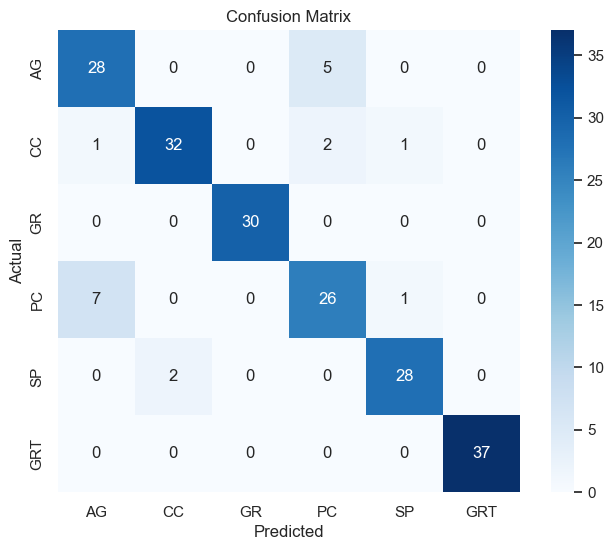

In [214]:
from sklearn.metrics import confusion_matrix
y_pred = rf_classifier.predict(test_features)
conf_matrix = confusion_matrix(Y_test[0:200], y_pred)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", square=True, xticklabels=list(particleType), yticklabels=list(particleType))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### CNN-LSTM20 with random forest

In [ ]:
import tensorflow as tf
from tensorflow import keras
importlib.reload(trans_rf)

cnnlstm20 = keras.models.load_model('models/lstm-Final-128bs-20e.keras')
print(cnnlstm20.summary())

train_features, test_features = trans_rf.dataGenerate(X_train.copy()[0:2000], X_test.copy()[0:200], Y_train.copy()[0:2000], Y_test.copy()[0:200], 
            layer_file='models/lstm20-layer.csv', testlayer_file='models/lstm20-layer-test.csv', input_model=cnnlstm20, layer_name='lstm_1',feature_size=1024 )
trans_rf.train_and_evaluate(train_features, test_features, Y_train[0:2000], Y_test[0:200], rf_file='models/cnnlstm20-rf_model.joblib')

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_0 (Conv2D)             (None, 64, 64, 64)        640       
                                                                 
 pool_0 (MaxPooling2D)       (None, 32, 32, 64)        0         
                                                                 
 conv_1 (Conv2D)             (None, 16, 16, 128)       73856     
                                                                 
 pool_1 (MaxPooling2D)       (None, 8, 8, 128)         0         
                                                                 
 conv_2 (Conv2D)             (None, 4, 4, 256)         295168    
                                                                 
 pool_2 (MaxPooling2D)       (None, 2, 2, 256)         0         
                                                                 
 time_distributed (TimeDist  (None, 2, 512)           

# CNN with different epochs

In [ ]:
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2)}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/cnn-final30'
    print(fileName, ' Test Accuracy: %1.4f' % cnn.train_and_evaluate(X_train.copy()[0:3000], X_test.copy()[0:300], Y_train.copy()[0:3000], Y_test.copy()[0:300], 
            file_name=fileName, params=cnnParameters[i], num_epochs = 30, batch_size=128))

The file models/cnn-final30 already exists.
models/cnn-final30  Test Accuracy: 0.8700


In [ ]:
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2)}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/cnn-final27'
    print(fileName, ' Test Accuracy: %1.4f' % cnn.train_and_evaluate(X_train.copy()[0:3000], X_test.copy()[0:300], Y_train.copy()[0:3000], Y_test.copy()[0:300], 
            file_name=fileName, params=cnnParameters[i], num_epochs = 27, batch_size=128))

The file models/cnn-final27 already exists.
models/cnn-final27  Test Accuracy: 0.8400


In [ ]:
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2)}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/cnn-final25'
    print(fileName, ' Test Accuracy: %1.4f' % cnn.train_and_evaluate(X_train.copy()[0:3000], X_test.copy()[0:300], Y_train.copy()[0:3000], Y_test.copy()[0:300], 
            file_name=fileName, params=cnnParameters[i], num_epochs = 25, batch_size=128))

The file models/cnn-final25 already exists.
models/cnn-final25  Test Accuracy: 0.8500


In [ ]:
cnnParameters=[{"kernel_size":(3,3),"strides":(2, 2)}]
for i, m in enumerate(cnnParameters):
    fileName = 'models/cnn-final20'
    print(fileName, ' Test Accuracy: %1.4f' % cnn.train_and_evaluate(X_train.copy()[0:3000], X_test.copy()[0:300], Y_train.copy()[0:3000], Y_test.copy()[0:300], 
            file_name=fileName, params=cnnParameters[i], num_epochs = 20, batch_size=128))

The file models/cnn-final20 already exists.
models/cnn-final20  Test Accuracy: 0.8733


# CNN 30 epochs + Rondom Forest

In [95]:

cnnFinal30 = keras.models.load_model('models/cnn-final30.keras')
print(cnnFinal30.summary())
accuracy = cnnFinal30.evaluate(x=X_test.copy()[0:300], y=Y_test.copy()[0:300], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_1 (Conv2D)             (None, 64, 64, 32)        320       
                                                                 
 pool_1 (MaxPooling2D)       (None, 32, 32, 32)        0         
                                                                 
 conv_2 (Conv2D)             (None, 16, 16, 64)        18496     
                                                                 
 pool_2 (MaxPooling2D)       (None, 8, 8, 64)          0         
                                                                 
 flatten (Flatten)           (None, 4096)              0         
                                                                 
 fc_1 (Dense)                (None, 1024)              4195328   
                                                                 
 dropout (Dropout)           (None, 1024)              0

In [96]:
import transform_rf as trans_rf
importlib.reload(trans_rf)

train_features, test_features = trans_rf.dataGenerate(X_train.copy()[0:3000], X_test.copy()[0:300], Y_train.copy()[0:3000], Y_test.copy()[0:300], 
                layer_file='models/cnn-final30.csv', testlayer_file='models/cnn-final30test.csv', input_model=cnnFinal30, layer_name='fc_1',feature_size=1024 )
trans_rf.train_and_evaluate(train_features, test_features, Y_train[0:3000], Y_test[0:300], rf_file='models/cnn-final30-rf_model.joblib')

Training Features Shape: (2000, 1025)
Training Labels Shape: (2000,)
Test Features Shape: (300, 1025)
Test Labels Shape: (300,)
(2000, 1025)
(300, 1025)
Accuracy: 0.87
Classification Report:
              precision    recall  f1-score   support

         0.0       0.72      0.78      0.75        50
         1.0       0.92      0.88      0.90        50
         2.0       0.94      0.94      0.94        50
         3.0       0.73      0.72      0.73        50
         4.0       0.92      0.90      0.91        50
         5.0       1.00      1.00      1.00        50

    accuracy                           0.87       300
   macro avg       0.87      0.87      0.87       300
weighted avg       0.87      0.87      0.87       300



# CNN 20 epochs + Rondom Forest

In [97]:

cnnFinal20 = keras.models.load_model('models/cnn-final20.keras')
print(cnnFinal20.summary())

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_1 (Conv2D)             (None, 64, 64, 32)        320       
                                                                 
 pool_1 (MaxPooling2D)       (None, 32, 32, 32)        0         
                                                                 
 conv_2 (Conv2D)             (None, 16, 16, 64)        18496     
                                                                 
 pool_2 (MaxPooling2D)       (None, 8, 8, 64)          0         
                                                                 
 flatten_4 (Flatten)         (None, 4096)              0         
                                                                 
 fc_1 (Dense)                (None, 1024)              4195328   
                                                                 
 dropout_4 (Dropout)         (None, 1024)             

In [98]:
import transform_rf as trans_rf
importlib.reload(trans_rf)

train_features, test_features = trans_rf.dataGenerate(X_train.copy()[0:3000], X_test.copy()[0:300], Y_train.copy()[0:3000], Y_test.copy()[0:300], 
                layer_file='models/cnn-final20.csv', testlayer_file='models/cnn-final20test.csv', input_model=cnnFinal20, layer_name='fc_1',feature_size=1024 )
trans_rf.train_and_evaluate(train_features, test_features, Y_train[0:3000], Y_test[0:300], rf_file='models/cnn-final20-rf_model.joblib')

Training Features Shape: (2000, 1025)
Training Labels Shape: (2000,)
Test Features Shape: (300, 1025)
Test Labels Shape: (300,)
(2000, 1025)
(300, 1025)
Accuracy: 0.88
Classification Report:
              precision    recall  f1-score   support

         0.0       0.78      0.76      0.77        50
         1.0       0.88      0.88      0.88        50
         2.0       0.96      0.98      0.97        50
         3.0       0.75      0.80      0.78        50
         4.0       0.94      0.88      0.91        50
         5.0       1.00      1.00      1.00        50

    accuracy                           0.88       300
   macro avg       0.88      0.88      0.88       300
weighted avg       0.88      0.88      0.88       300



# CNN with Aug + Random Forest

In [99]:
cnnAug18 = keras.models.load_model('models/cnn-final-aug18.keras')
print(cnnAug18.summary())
accuracy = cnnAug18.evaluate(x=X_test[0:300], y=Y_test[0:300], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_1 (Conv2D)             (None, 64, 64, 32)        320       
                                                                 
 pool_1 (MaxPooling2D)       (None, 32, 32, 32)        0         
                                                                 
 conv_2 (Conv2D)             (None, 16, 16, 64)        18496     
                                                                 
 pool_2 (MaxPooling2D)       (None, 8, 8, 64)          0         
                                                                 
 flatten_5 (Flatten)         (None, 4096)              0         
                                                                 
 fc_1 (Dense)                (None, 1024)              4195328   
                                                                 
 dropout_4 (Dropout)         (None, 1024)             

In [100]:
import transform_rf as trans_rf
importlib.reload(trans_rf)
#augX_train, X_test.copy()[0:300], augY_train, Y_test.copy()[0:300]
train_features, test_features = trans_rf.dataGenerate(augX_train[0:2000], X_test.copy()[0:200], augY_train[0:2000], Y_test.copy()[0:200], 
                layer_file='models/cnn-aug18-2.csv', testlayer_file='models/cnn-aug18test-2.csv', input_model=cnnAug18, layer_name='dropout_4',feature_size=1024 )
trans_rf.train_and_evaluate(train_features, test_features, Y_train[0:2000], Y_test[0:200], rf_file='models/cnn-aug18-rf-=2_model.joblib')



Training Features Shape: (2000, 1025)
Training Labels Shape: (2000,)
Test Features Shape: (200, 1025)
Test Labels Shape: (200,)
(2000, 1025)
(200, 1025)
Accuracy: 0.88
Classification Report:
              precision    recall  f1-score   support

         0.0       0.79      0.79      0.79        33
         1.0       0.89      0.92      0.90        36
         2.0       0.97      0.93      0.95        30
         3.0       0.74      0.76      0.75        34
         4.0       0.90      0.87      0.88        30
         5.0       1.00      1.00      1.00        37

    accuracy                           0.88       200
   macro avg       0.88      0.88      0.88       200
weighted avg       0.88      0.88      0.88       200



# CNN + ANN + Random Forest

In [101]:
cnnANN = keras.models.load_model('models/ann-1-cnn1-hidden_cnn.keras')
print(cnnANN.summary())
accuracy = cnnANN.evaluate(x=X_test[0:200], y=Y_test[0:200], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_0 (Conv2D)             (None, 128, 128, 128)     3328      
                                                                 
 pool_0 (MaxPooling2D)       (None, 64, 64, 128)       0         
                                                                 
 conv_1 (Conv2D)             (None, 64, 64, 128)       409728    
                                                                 
 pool_1 (MaxPooling2D)       (None, 32, 32, 128)       0         
                                                                 
 flatten_7 (Flatten)         (None, 131072)            0         
                                                                 
 dense_10 (Dense)            (None, 300)               39321900  
                                                                 
 dense_11 (Dense)            (None, 100)              

In [104]:
import transform_rf as trans_rf
importlib.reload(trans_rf)
#augX_train, X_test.copy()[0:300], augY_train, Y_test.copy()[0:300]
train_features, test_features = trans_rf.dataGenerate(X_train[0:2000], X_test.copy()[0:200], Y_train[0:2000], Y_test.copy()[0:200], 
                layer_file='models/cnnANN.csv', testlayer_file='models/cnnANN-test.csv', input_model=cnnANN, layer_name='dense_11',feature_size=100 )
trans_rf.train_and_evaluate(train_features, test_features, Y_train[0:2000], Y_test[0:200], rf_file='models/cnnANN-rf_model.joblib')

Training Features Shape: (2000, 101)
Training Labels Shape: (2000,)
Test Features Shape: (200, 101)
Test Labels Shape: (200,)
(2000, 101)
(200, 101)
Accuracy: 0.87
Classification Report:
              precision    recall  f1-score   support

         0.0       0.75      0.73      0.74        33
         1.0       0.94      0.92      0.93        36
         2.0       1.00      0.83      0.91        30
         3.0       0.69      0.79      0.74        34
         4.0       0.88      0.93      0.90        30
         5.0       1.00      1.00      1.00        37

    accuracy                           0.87       200
   macro avg       0.88      0.87      0.87       200
weighted avg       0.88      0.87      0.87       200



In [39]:

cnnANN = keras.models.load_model('models/ANN-CNN128-ep5.keras')
print(cnnANN.summary())
accuracy = cnnANN.evaluate(x=X_test[0:200], y=Y_test[0:200], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_0 (Conv2D)             (None, 64, 64, 64)        640       
                                                                 
 pool_0 (MaxPooling2D)       (None, 32, 32, 64)        0         
                                                                 
 conv_1 (Conv2D)             (None, 16, 16, 128)       73856     
                                                                 
 pool_1 (MaxPooling2D)       (None, 8, 8, 128)         0         
                                                                 
 conv_2 (Conv2D)             (None, 4, 4, 256)         295168    
                                                                 
 pool_2 (MaxPooling2D)       (None, 2, 2, 256)         0         
                                                                 
 flatten_20 (Flatten)        (None, 1024)            

In [215]:
import transform_rf as trans_rf
importlib.reload(trans_rf)
#augX_train, X_test.copy()[0:300], augY_train, Y_test.copy()[0:300]
train_features, test_features = trans_rf.dataGenerate(X_train[0:2000], X_test.copy()[0:200], Y_train[0:2000], Y_test.copy()[0:200], 
                layer_file='models/cnnANN-ep5.csv', testlayer_file='models/cnnANN-ep5-test.csv', input_model=cnnANN, layer_name='dense_62',feature_size=100 )
rf_classifier = trans_rf.train_and_evaluate(train_features, test_features, Y_train[0:2000], Y_test[0:200], rf_file='models/cnnANN-rf-ep5_model.joblib')

Training Features Shape: (2000, 101)
Training Labels Shape: (2000,)
Test Features Shape: (200, 101)
Test Labels Shape: (200,)
(2000, 101)
(200, 101)
Accuracy: 0.91
Classification Report:
              precision    recall  f1-score   support

         0.0       0.84      0.82      0.83        33
         1.0       0.89      0.92      0.90        36
         2.0       0.97      0.97      0.97        30
         3.0       0.82      0.79      0.81        34
         4.0       0.90      0.93      0.92        30
         5.0       1.00      1.00      1.00        37

    accuracy                           0.91       200
   macro avg       0.90      0.90      0.90       200
weighted avg       0.90      0.91      0.90       200



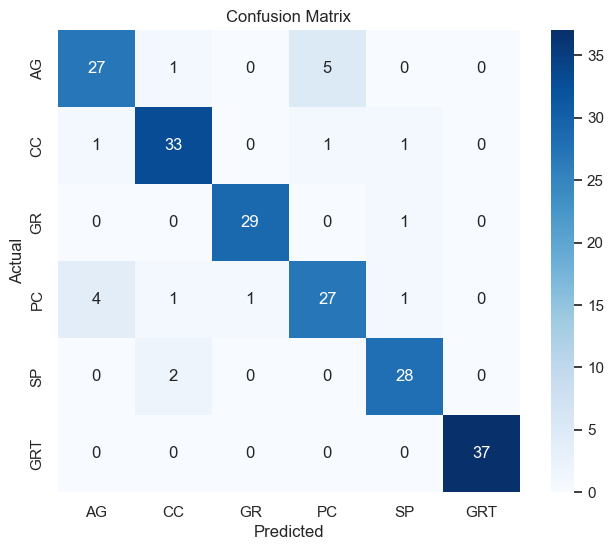

In [216]:
from sklearn.metrics import confusion_matrix
y_pred = rf_classifier.predict(test_features)
conf_matrix = confusion_matrix(Y_test[0:200], y_pred)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", square=True, xticklabels=list(particleType), yticklabels=list(particleType))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# CNN + FFN + Random Forest

In [20]:
cnnFFN = keras.models.load_model('models/FFN-CNN128-ep6.keras')
print(cnnFFN.summary())
accuracy = cnnFFN.evaluate(x=X_test[0:200], y=Y_test[0:200], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_0 (Conv2D)             (None, 64, 64, 128)       1280      
                                                                 
 pool_0 (MaxPooling2D)       (None, 32, 32, 128)       0         
                                                                 
 conv_1 (Conv2D)             (None, 16, 16, 128)       147584    
                                                                 
 pool_1 (MaxPooling2D)       (None, 8, 8, 128)         0         
                                                                 
 flatten_3 (Flatten)         (None, 8192)              0         
                                                                 
 dense_18 (Dense)            (None, 128)               1048704   
                                                                 
 dense_19 (Dense)            (None, 128)              

In [75]:
import transform_rf as trans_rf
importlib.reload(trans_rf)
#augX_train, X_test.copy()[0:300], augY_train, Y_test.copy()[0:300]
train_features, test_features = trans_rf.dataGenerate(X_train[0:2000], X_test.copy()[0:200], Y_train[0:2000], Y_test.copy()[0:200], 
                layer_file='models/cnnFFN.csv', testlayer_file='models/cnnFFN-test.csv', input_model=cnnFFN, layer_name='flatten_3',feature_size=8192 )
trans_rf.train_and_evaluate(train_features, test_features, Y_train[0:2000], Y_test[0:200], rf_file='models/cnnFFN-rf_model.joblib')

Training Features Shape: (2000, 8193)
Training Labels Shape: (2000,)
Test Features Shape: (200, 8193)
Test Labels Shape: (200,)
(2000, 8193)
(200, 8193)
Accuracy: 0.89
Classification Report:
              precision    recall  f1-score   support

         0.0       0.84      0.79      0.81        33
         1.0       0.91      0.89      0.90        36
         2.0       0.93      0.93      0.93        30
         3.0       0.76      0.76      0.76        34
         4.0       0.85      0.93      0.89        30
         5.0       1.00      1.00      1.00        37

    accuracy                           0.89       200
   macro avg       0.88      0.88      0.88       200
weighted avg       0.89      0.89      0.88       200



In [88]:
import transform_rf as trans_rf
importlib.reload(trans_rf)

cnnFFN = keras.models.load_model('models/FFN-CNN128-ep5.keras')
print(cnnFFN.summary())
accuracy = cnnFFN.evaluate(x=X_test[0:200], y=Y_test[0:200], verbose=1,return_dict=True)['accuracy']
print(f"Accuracy: {accuracy:.2f}")

train_features, test_features = trans_rf.dataGenerate(X_train[0:2000], X_test.copy()[0:200], Y_train[0:2000], Y_test.copy()[0:200], 
                layer_file='models/cnnFFN-ep5.csv', testlayer_file='models/cnnFFN-ep5-test.csv', input_model=cnnFFN, layer_name='dropout_19',feature_size=256 )
trans_rf.train_and_evaluate(train_features, test_features, Y_train[0:2000], Y_test[0:200], rf_file='models/cnnFFN-ep5-rf_model.joblib')

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_0 (Conv2D)             (None, 64, 64, 64)        640       
                                                                 
 pool_0 (MaxPooling2D)       (None, 32, 32, 64)        0         
                                                                 
 conv_1 (Conv2D)             (None, 16, 16, 128)       73856     
                                                                 
 pool_1 (MaxPooling2D)       (None, 8, 8, 128)         0         
                                                                 
 conv_2 (Conv2D)             (None, 4, 4, 256)         295168    
                                                                 
 pool_2 (MaxPooling2D)       (None, 2, 2, 256)         0         
                                                                 
 flatten_23 (Flatten)        (None, 1024)            

In [91]:
cnnFFN = keras.models.load_model('models/FFN-CNN128-ep5.keras')
train_features, test_features = trans_rf.dataGenerate(X_train[0:2000], X_test.copy()[0:200], Y_train[0:2000], Y_test.copy()[0:200], 
                layer_file='models/cnnFFN-ep5-2.csv', testlayer_file='models/cnnFFN-ep5-2-test.csv', input_model=cnnFFN, layer_name='flatten_23',feature_size=1024 )
trans_rf.train_and_evaluate(train_features, test_features, Y_train[0:2000], Y_test[0:200], rf_file='models/cnnFFN-ep5-2-rf_model.joblib')

Training Features Shape: (2000, 1025)
Training Labels Shape: (2000,)
Test Features Shape: (200, 1025)
Test Labels Shape: (200,)
(2000, 1025)
(200, 1025)
Accuracy: 0.90
Classification Report:
              precision    recall  f1-score   support

         0.0       0.79      0.82      0.81        33
         1.0       0.94      0.89      0.91        36
         2.0       1.00      0.97      0.98        30
         3.0       0.79      0.76      0.78        34
         4.0       0.88      0.97      0.92        30
         5.0       1.00      1.00      1.00        37

    accuracy                           0.90       200
   macro avg       0.90      0.90      0.90       200
weighted avg       0.90      0.90      0.90       200



In [159]:
print(cnnFFN.summary())

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_0 (Conv2D)             (None, 64, 64, 64)        640       
                                                                 
 pool_0 (MaxPooling2D)       (None, 32, 32, 64)        0         
                                                                 
 conv_1 (Conv2D)             (None, 16, 16, 128)       73856     
                                                                 
 pool_1 (MaxPooling2D)       (None, 8, 8, 128)         0         
                                                                 
 conv_2 (Conv2D)             (None, 4, 4, 256)         295168    
                                                                 
 pool_2 (MaxPooling2D)       (None, 2, 2, 256)         0         
                                                                 
 flatten_23 (Flatten)        (None, 1024)            

# Deep Learning with Random Forest Results

NN Name | hidden_layer | CNN_Hidden | Kernal | strides |  epochs | batch | features | parameters | Accuracy | RF Accuracy
-|-|-|-|-|-|-|-|-|-|-
CNN | | |(3,3) |(2,2)|  30 | 128 |1024 | 9293830 | 0.87 | 0.87
CNN | | |(3,3) |(2,2)|  20 | 128 |1024 | 9293830 | 0.87 | 0.90
CNN + Aug | | |(3,3) |(2,2)|  18 | 128 |1024 | 4220294 | 0.86 | 0.87
CNN + LSTM| | [64, 128, 256]|(3,3) |(2,2)|  6 | 128 |1024 | 9293830 |0.88 | 0.91
CNN + LSTM| | [64, 128, 256]|(3,3) |(2,2)|  20 | 128 |1024 |9293830 |0.89 | 0.90
CNN + ANN| | [128, 128]|(3,3) |(2,2)|  6 | 128 |100 |39765662 | 0.84 | 0.88
CNN + ANN| | [64, 128, 256]|(3,3) |(2,2)|  5 | 128 |100 |707870| 0.90 | 0.91
CNN + FFN|[128, 128] | [128, 128]|(3,3) |(2,2)|  6 | 128 |8192 | 1214854| 0.89 | 0.89
CNN + FFN|[64, 128, 256] |[64, 128, 256]|(3,3) |(2,2)|  5 | 128 |256 | 478150|0.90 | 0.90
CNN + FFN|[64, 128, 256] |[64, 128, 256]|(3,3) |(2,2)|  5 | 128 |1024 |478150| 0.90 | 0.90